<a href="https://colab.research.google.com/gist/sabdha/13df99c7c3063da4e24faa48d4171eb4/alexnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Data Loading and exploration**

In [ ]:
!unzip '/content/drive/MyDrive/Solar_Training-20220922T162051Z-001.zip' 

In [ ]:
import os
import numpy as np
from PIL import Image
for i in (os.listdir('/content/Solar_Training/CleanPV')):
  if np.array(Image.open('/content/Solar_Training/CleanPV'+'/'+str(i))).shape[2] == 4:
    img = Image.fromarray(np.array(Image.open('/content/Solar_Training/CleanPV'+'/'+i))).convert('RGB')
    print(np.array(img).shape)
    img.save('/content/Solar_Training/CleanPV'+'/'+i)
    img.show()
    print(i)

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


In [ ]:
for i in (os.listdir('/content/Solar_Training/DirtyPV')):
  if np.array(Image.open('/content/Solar_Training/DirtyPV'+'/'+str(i))).shape[2] == 4:
    img = Image.fromarray(np.array(Image.open('/content/Solar_Training/DirtyPV'+'/'+i))).convert('RGB')
    print(np.array(img).shape)
    img.save('/content/Solar_Training/DirtyPV'+'/'+i)
    img.show()
    print(i)


In [ ]:
import os
# Function to rename multiple files
def main():
   
    folder = "/content/Solar_Training/CleanPV"
    for count, filename in enumerate(os.listdir(folder)):
        dst = f"CleanPV.{str(count+1)}.jpg"
        src =f"{folder}/{filename}"  # foldername/filename, if .py file is outside folder
        dst =f"{folder}/{dst}"
         
        # rename() function will
        # rename all the files
        os.rename(src, dst)
 
# Driver Code
if __name__ == '__main__':
     
    # Calling main() function
    main()

In [ ]:
# Function to rename multiple files
def main():
   
    folder = "/content/Solar_Training/DirtyPV"
    for count, filename in enumerate(os.listdir(folder)):
        dst = f"DirtyPV.{str(count+1)}.jpg"
        src =f"{folder}/{filename}"  # foldername/filename, if .py file is outside folder
        dst =f"{folder}/{dst}"
         
        # rename() function will
        # rename all the files
        os.rename(src, dst)
 
# Driver Code
if __name__ == '__main__':
     
    # Calling main() function
    main()

In [ ]:
import os 
import glob

directory = '/content/Solar_Training/DirtyPV'
os.chdir(directory)
files = glob.glob('*.jpg')
for filename in files[880:]:
  os.unlink(filename)

In [ ]:
import os

_, _, files = next(os.walk("/content/Solar_Training/CleanPV"))
Clean_count = len(files)
Clean_count

880

In [ ]:
import os

_, _, files = next(os.walk("/content/Solar_Training/DirtyPV"))
Dirty_count = len(files)
Dirty_count

880

In [ ]:
os.mkdir('/content/Solar_Training/Train') 

In [ ]:
import shutil

original = r'/content/Solar_Training/DirtyPV'
target = r'/content/Solar_Training/Train'

shutil.move(original, target)

'/content/Solar_Training/Train/DirtyPV'

In [ ]:
import shutil

original = r'/content/Solar_Training/CleanPV'
target = r'/content/Solar_Training/Train'

shutil.move(original, target)

'/content/Solar_Training/Train/CleanPV'

In [ ]:
!pip install split-folders
import splitfolders
splitfolders.ratio('/content/Solar_Training/Train', output='/content/drive/MyDrive/Alexa_splitfolder', seed=42, ratio=(.8,.2), group_prefix=None)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
# import metric
from keras.metrics import categorical_crossentropy
# optimization method 
from tensorflow.keras.optimizers import SGD

In [ ]:
def Alexnet():
  # Initialize the model
  model = Sequential()

  # layer 1: convolutional layer + max-pooling layer
  model.add(Conv2D(filters = 96, kernel_size = (11,11), strides= 4, padding = 'valid', activation='relu', input_shape = (227,227,3)))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layer 2: convolutional layer + max-pooling layer 
  model.add(Conv2D(filters = 256, kernel_size = (5,5), padding = 'same', activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layers 3-5: three convolutional layers + 1 max-pooling layer
  model.add(Conv2D(filters = 384, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(Conv2D(filters = 384, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layers 6 - 8: two fully connected hidden layers and one fully connected output layer
  model.add(Flatten())
  model.add(Dense(4096, activation = 'relu'))
  model.add(Dropout(0.5))
  model.add(Dense(4096, activation = 'relu'))
  model.add(Dropout(0.5))
  model.add(Dense(1000, activation = 'softmax'))

  # compile the model with a loss funciton, a metric and and optimizer method for estimating the loss function
  opt = SGD(lr = 0.1)
  model.compile(loss = categorical_crossentropy,
                optimizer = opt,
                metrics = ['accuracy'])

  return model

In [ ]:
Alexnet_model = Alexnet()
Alexnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 55, 55, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 27, 27, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 27, 27, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 13, 13, 256)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 13, 13, 384)       885120    
                                                                 
 conv2d_3 (Conv2D)           (None, 13, 13, 384)       1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [ ]:
%cd /content/drive/MyDrive
train_path = os.getcwd() + '/' + 'Alexa_splitfolder/train/'
test_path = os.getcwd() + '/' + 'Alexa_splitfolder/val/'

In [ ]:
print('The test set consists of ', len(os.listdir(test_path + 'DirtyPV/')), 
      ' Dirty images and ', len(os.listdir(test_path + 'CleanPV/')), ' Clean images.' )

The test set consists of  176  Dirty images and  176  Clean images.


In [ ]:
print('The training set consists of ', len(os.listdir(train_path +  'DirtyPV/')), 
      ' dog images and ', len(os.listdir(train_path + 'CleanPV/')), ' cat images.' )

The training set consists of  704  dog images and  704  cat images.


In [ ]:
import cv2
from PIL import Image
import numpy as np

cates = ['DirtyPV', 'CleanPV']
def load_images_and_labels(data_path, cates): 
  X = []
  y = []
  i = 0
  for index, cate in enumerate(cates): 
    for img_name in os.listdir(data_path + cate + '/'):
      i = i +1
      print(i)
      img = cv2.imread(data_path + cate + '/' + img_name)
      if img is not None: 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_array = Image.fromarray(img, 'RGB')
        # resize image to 227x227 which is the required input size of the Alexnet model
        img_rs = img_array.resize((227,227))
        # convert the image to array
        img_rs = np.array(img_rs)
      
        X.append(img_rs)
        y.append(index)
  return X, y

In [ ]:
X_train, y_train = load_images_and_labels(train_path, cates)
X_test, y_test = load_images_and_labels(test_path, cates)

In [ ]:
data_dict = {'X_train' : X_train, 
             'y_train': y_train, 
             'X_test': X_test, 
             'y_test': y_test}
np.save('data_dict.npy', data_dict)

In [ ]:
data_dict_ = np.load('data_dict.npy', allow_pickle = True).item()
X_train = data_dict_['X_train']
y_train = data_dict_['y_train']
X_test = data_dict_['X_test']
y_test = data_dict_['y_test']

In [ ]:
import matplotlib.pyplot as plt
import random
plt.figure(figsize = (12,7))
cate = ['DirtyPV', 'CleanPV']
for i in range(8):
  ind = random.randint(0, len(X_train))
  plt.subplot(240 + 1 + i)
  plt.imshow(X_train[ind])
  plt.title(cate[y_train[ind]])

### **Data Preprocessing**
This task consists of the following steps:

Convert integer values into floats


 
*   Convert integer values into floats

*   One-hot encoding



* Normalization



In [ ]:
from tensorflow.keras.utils import to_categorical

def preprocess_data(X, y):
  # convert X from list to array
  X = np.array(X)
  
  # convert integer values of X into floats
  X = X.astype(np.float32)

  # normalization 
  X = X/255.0
  
  # one-hot encoding the labels 
  y = to_categorical(np.array(y))
    
  return X, y
  
(X_train, y_train) = preprocess_data(X_train, y_train)
(X_test, y_test) = preprocess_data(X_test, y_test)

In [ ]:
plt.figure(figsize = (12,7))
for i in range(8):
  ind = random.randint(0, len(X_train))
  plt.subplot(240 + 1 + i)
  plt.imshow(X_train[ind])
  plt.title(cate[np.argmax(y_train[ind])])

### **Define the Alexnet model**

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
# metric
from keras.metrics import binary_crossentropy
# optimization method (Stochastic Gradient Descent (SGD))
from tensorflow.keras.optimizers import SGD

In [ ]:
def Alexnet():
  # Initialize the model
  model = Sequential()

  # layer 1: convolutional layer + max-pooling layer
  model.add(Conv2D(filters = 96, kernel_size = (11,11), strides= 4, padding = 'valid', 
                   activation='relu', input_shape = (227,227,3)))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layer 2: convolutional layer + max-pooling layer 
  model.add(Conv2D(filters = 256, kernel_size = (5,5), padding = 'same', 
                   activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layers 3-5: three convolutional layers + 1 max-pooling layer
  model.add(Conv2D(filters = 384, kernel_size = (3,3), padding = 'same', 
                   activation = 'relu'))
  model.add(Conv2D(filters = 384, kernel_size = (3,3), padding = 'same', 
                   activation = 'relu'))
  model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', 
                   activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layers 6 - 8: two fully connected hidden layers and one fully connected output layer
  model.add(Flatten())
  model.add(Dense(4096, activation = 'relu'))
  model.add(Dropout(0.5))
  model.add(Dense(4096, activation = 'relu'))
  model.add(Dropout(0.5))
  model.add(Dense(2, activation = 'softmax'))

  # compile the model with a loss funciton, a metric and and optimizqation method
  opt = SGD(lr = 0.1)
  model.compile(loss = binary_crossentropy,
                optimizer = opt,
                metrics = ['accuracy'])
  return model

In [ ]:
Alexnet_model = Alexnet()Alexnet_model.summary()

### **Train the model**


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

def train_model(model, X_train, y_train, X_test, y_test, epochs, batch_size):
  # Data generator
  datagen = ImageDataGenerator(rotation_range = 5, width_shift_range = 0.1, 
                               height_shift_range = 0.1, horizontal_flip = True)
  # iteration on the training set
  it_train = datagen.flow(X_train, y_train, batch_size = batch_size)
  # path to save the checkpoint 
  path_cp = os.getcwd() + '/' + 'weights_.hdf5'
  checkpoint_ = ModelCheckpoint(path_cp, monitor = 'loss', save_best_only = True, 
                                mode = 'auto')
  steps = X_train.shape[0]//batch_size
  # Fitting the model
  history = model.fit_generator(it_train, epochs = epochs, steps_per_epoch = steps, 
                                validation_data = (X_test, y_test), verbose = 1, 
                                callbacks = checkpoint_)
  # Evaluating the model
  _, acc = model.evaluate(X_test, y_test, verbose = 1)
  print('%.3f' % (acc * 100.0))
  
  return history, acc

train_history, acc = train_model(Alexnet_model, X_train, y_train, X_test, y_test, epochs = 100, batch_size = 128)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/100
11/11 [==============================] - 27s 1s/step - loss: 0.6931 - accuracy: 0.5114 - val_loss: 0.6895 - val_accuracy: 0.6790
Epoch 2/100
11/11 [==============================] - 17s 2s/step - loss: 0.6884 - accuracy: 0.5753 - val_loss: 0.6842 - val_accuracy: 0.5000
Epoch 3/100
11/11 [==============================] - 17s 2s/step - loss: 0.6814 - accuracy: 0.6072 - val_loss: 0.7209 - val_accuracy: 0.5000
Epoch 4/100
11/11 [==============================] - 16s 1s/step - loss: 0.6832 - accuracy: 0.5589 - val_loss: 0.6740 - val_accuracy: 0.6818
Epoch 5/100
11/11 [==============================] - 16s 1s/step - loss: 0.6787 - accuracy: 0.5717 - val_loss: 0.6439 - val_accuracy: 0.6080
Epoch 6/100
11/11 [==============================] - 16s 1s/step - loss: 0.6704 - accuracy: 0.6151 - val_loss: 0.6300 - val_accuracy: 0.7301
Epoch 7/100
11/11 [==============================] - 15s 1s/step - loss: 0.6846 - accuracy: 0.6548 - val_loss: 0.6626 - val_accuracy: 0.5000
Epoch 8/100
1

### Save the training history and the accuracy:

In [ ]:
import pandas as pd
# convert the history.history dict to a pandas DataFrame:     
train_hist_df = pd.DataFrame(train_history.history) 

train_dict = {'train_hist': train_hist_df, 
              'acc': acc}
np.save('train_dict.npy', train_dict)   

### Save the trained model:

In [ ]:
Alexnet_model.save('/content/drive/MyDrive/Alexa_splitfolder/Alexnet_model.h5')

### Visualize the accuracies on both training and testing sets during training the model:

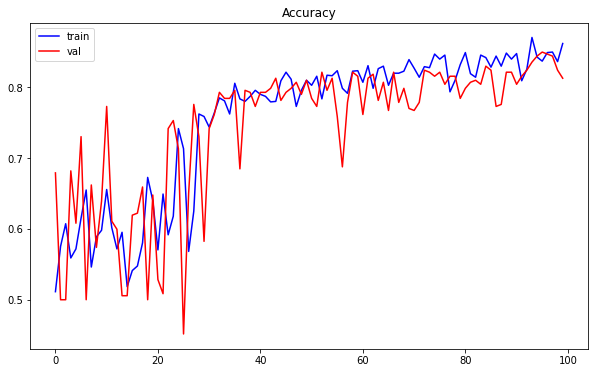

In [ ]:
def plot_accuracy(history):
  plt.figure(figsize = (10,6))
  plt.plot(history.history['accuracy'], color = 'blue', label = 'train')
  plt.plot(history.history['val_accuracy'], color = 'red', label = 'val')
  plt.legend()
  plt.title('Accuracy')
  plt.show()
  plot_accuracy(train_history)

### **Prediction**

In [ ]:
y_test_pred = []
for i in np.arange(len(X_test)):
  img = X_test[i]
  img = img.reshape(1, 227, 227, 3)
  y_p = Alexnet_model.predict(img)
  y_test_pred.append(y_p)

y_test_pred = np.asarray(y_test_pred)

### Determine the confusion matrix:

Text(69.0, 0.5, 'True classes')

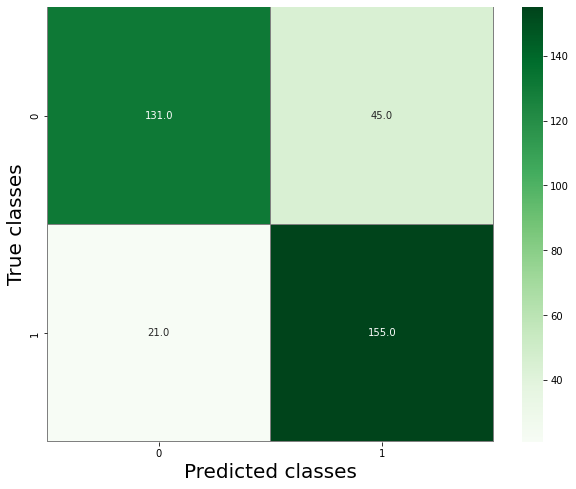

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns 

# Reverse the true and the predicted labels into the original binary 
# labels (0 and 1) to compute the confusion matrix
y_test_labels = [np.argmax(vect) for vect in y_test]
y_test_pred_labels = [np.argmax(vect) for vect in y_test_pred]

conf_mat = confusion_matrix(y_test_labels, y_test_pred_labels)

plt.figure(figsize = (10,8))
sns.heatmap(conf_mat, linewidths = 0.1, cmap = 'Greens', linecolor = 'gray', 
            fmt = '.1f', annot = True)
plt.xlabel('Predicted classes', fontsize = 20)
plt.ylabel('True classes', fontsize = 20)

This matrix describes the number of images that are correctly or incorrectly classified in each class. Based on this matrix, we see that:


*   131 DirtyPV images and 155 CleanPV images are classified correctly in their classes.
*  45 DirtyPV images are classified into the “CleanPV” class.
*   21 CleanPV images are classified into the “DirtyPV” class.






### **Visualize some images and their predicted classes:**

In [ ]:
plt.figure(figsize = (15,8))
for i in np.arange(8):
  # take randomly an indice
  ind = random.randint(0, len(X_test))
  img = X_test[ind]
  # reshape the image 
  img_rs = img.reshape(1,227,227,3)
  # predict the label of img
  y_pred = Alexnet_model.predict(img_rs)
  # determine the corresponding category
  predicted_cate = cate[np.argmax(y_pred)]
  plt.subplot(240+1+i)
  plt.imshow(img)  
  plt.title('predicted: ' + str(predicted_cate))

### **Loading the model **

In [ ]:
from keras.models import load_model
model = load_model('/content/drive/MyDrive/Alexa_splitfolder/Alexnet_model.h5')

In [ ]:
model.summary()

***Prediction on a Single Image***

In [ ]:
from keras.models import load_model
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import numpy as np
import matplotlib.pyplot as plt
import os 
from keras.models import load_model
  
model = load_model('/content/drive/MyDrive/Alexa_splitfolder/Alexnet_model.h5')
  
image = load_img('/content/drive/MyDrive/Test/CleanPV.97.jpg', target_size=(227, 227))
img = np.array(image)
img = img / 255.0
img = img.reshape(1,227,227,3)
label = np.argmax(model.predict(img))
# print(label)
# # print("Predicted Class (0 - Dirty , 1- Clean): ", label[0][0])
if label == 1:
    plt.title ("%.2f" %(model.predict(img)[0][1]*100)+ "% CleanPV")
else:
    plt.title("%.2f"%(model.predict(img)[0][0]*100)+ "%DirtyPV")

plt.imshow(image)

**Prediction on DirtyClean-Test-122 Folder**

CleanPV-TEST-(5).jpg
Actual: CleanPV


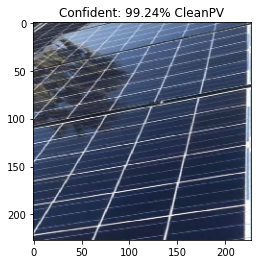

CleanPV-TEST-(41).jpg
Actual: CleanPV


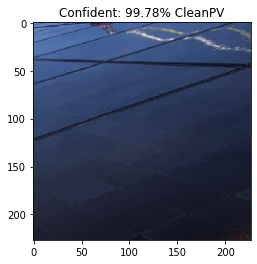

CleanPV-TEST-(42).jpg
Actual: CleanPV


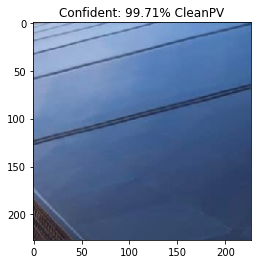

CleanPV-TEST-(46).jpg
Actual: CleanPV


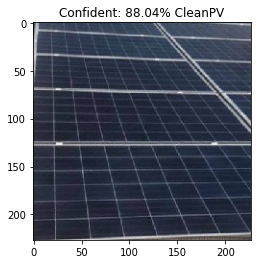

CleanPV-TEST-(43).jpg
Actual: CleanPV


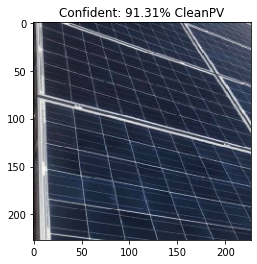

CleanPV-TEST-(49).jpg
Actual: CleanPV


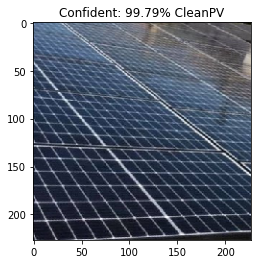

CleanPV-TEST-(47).jpg
Actual: CleanPV


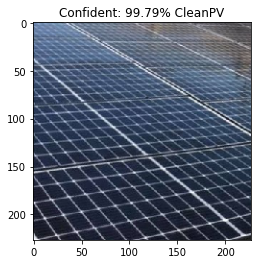

CleanPV-TEST-(44).jpg
Actual: CleanPV


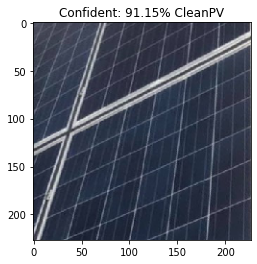

CleanPV-TEST-(48).jpg
Actual: CleanPV


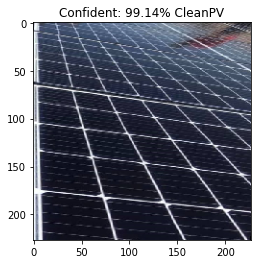

CleanPV-TEST-(40).jpg
Actual: CleanPV


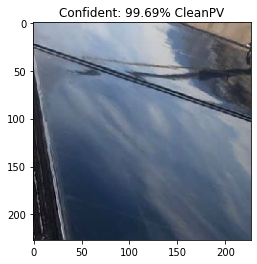

CleanPV-TEST-(4).jpg
Actual: CleanPV


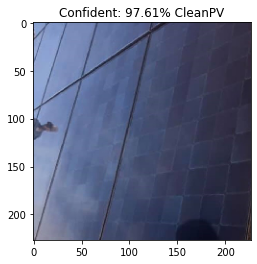

CleanPV-TEST-(37).jpg
Actual: CleanPV


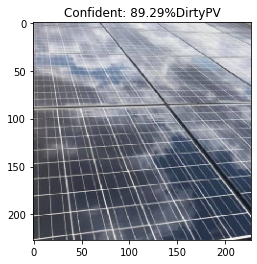

CleanPV-TEST-(35).jpg
Actual: CleanPV


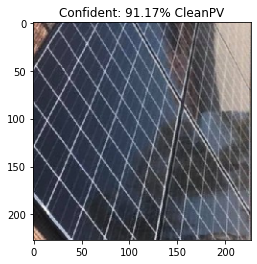

CleanPV-TEST-(33).jpg
Actual: CleanPV


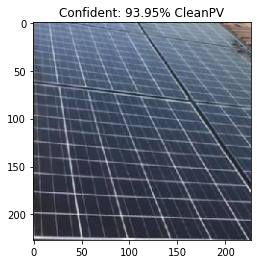

CleanPV-TEST-(36).jpg
Actual: CleanPV


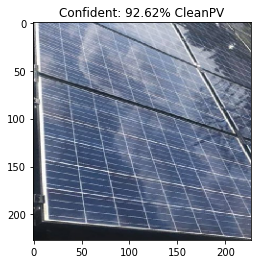

CleanPV-TEST-(39).jpg
Actual: CleanPV


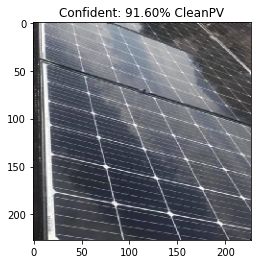

CleanPV-TEST-(38).jpg
Actual: CleanPV


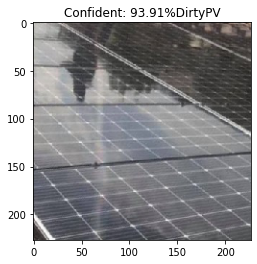

CleanPV-TEST-(34).jpg
Actual: CleanPV


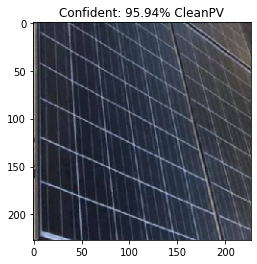

CleanPV-TEST-(32).jpg
Actual: CleanPV


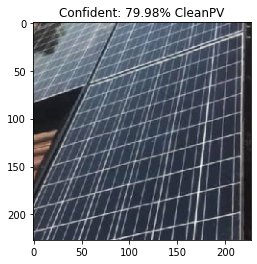

CleanPV-TEST-(31).jpg
Actual: CleanPV


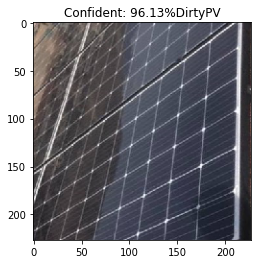

CleanPV-TEST-(29).jpg
Actual: CleanPV


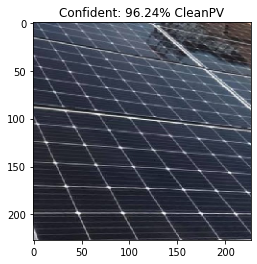

CleanPV-TEST-(30).jpg
Actual: CleanPV


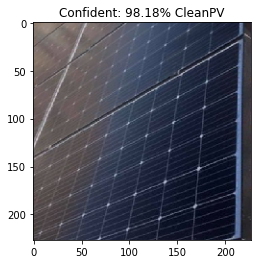

CleanPV-TEST-(25).jpg
Actual: CleanPV


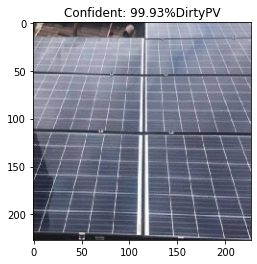

CleanPV-TEST-(3).jpg
Actual: CleanPV


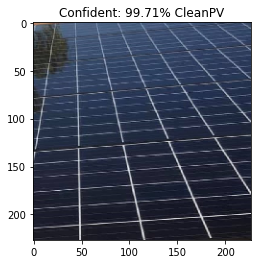

CleanPV-TEST-(28).jpg
Actual: CleanPV


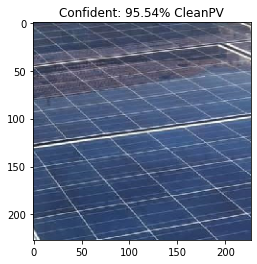

CleanPV-TEST-(23).jpg
Actual: CleanPV


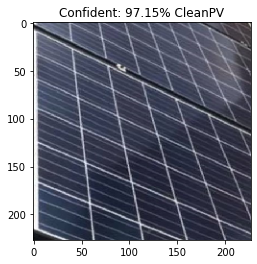

CleanPV-TEST-(27).jpg
Actual: CleanPV


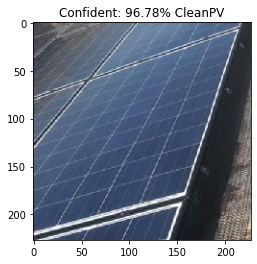

CleanPV-TEST-(26).jpg
Actual: CleanPV


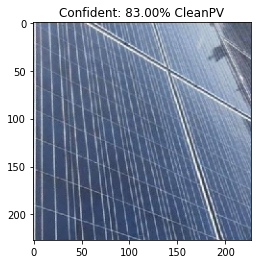

CleanPV-TEST-(24).jpg
Actual: CleanPV


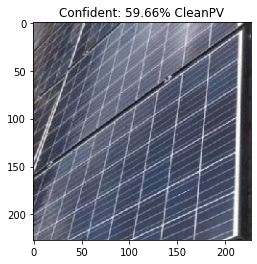

CleanPV-TEST-(22).jpg
Actual: CleanPV


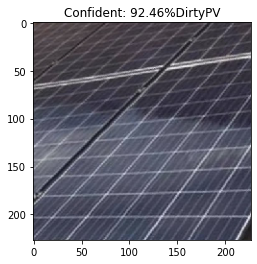

CleanPV-TEST-(21).jpg
Actual: CleanPV


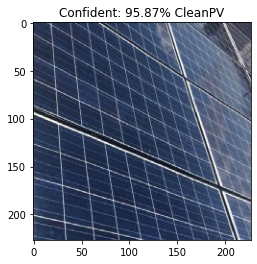

CleanPV-TEST-(2).jpg
Actual: CleanPV


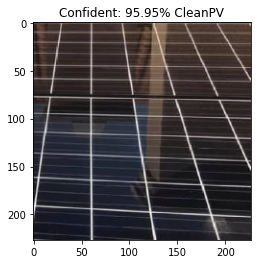

CleanPV-TEST-(15).jpg
Actual: CleanPV


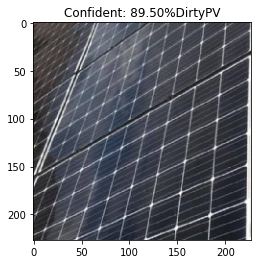

CleanPV-TEST-(18).jpg
Actual: CleanPV


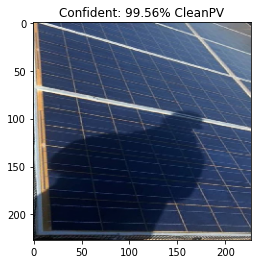

CleanPV-TEST-(20).jpg
Actual: CleanPV


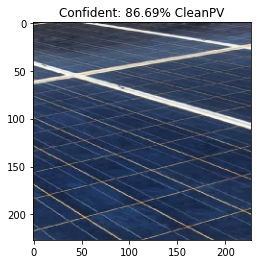

CleanPV-TEST-(14).jpg
Actual: CleanPV


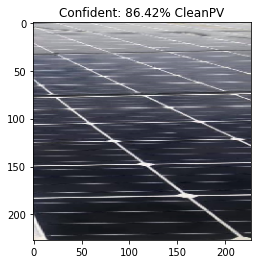

CleanPV-TEST-(13).jpg
Actual: CleanPV


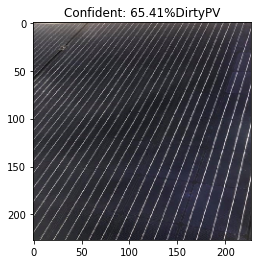

CleanPV-TEST-(12).jpg
Actual: CleanPV


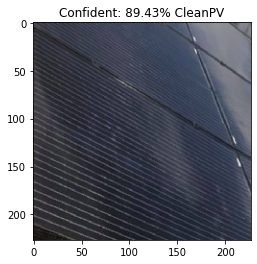

CleanPV-TEST-(11).jpg
Actual: CleanPV


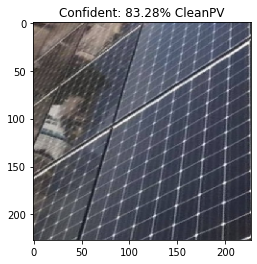

CleanPV-TEST-(10).jpg
Actual: CleanPV


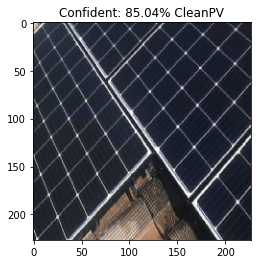

CleanPV-TEST-(1).jpg
Actual: CleanPV


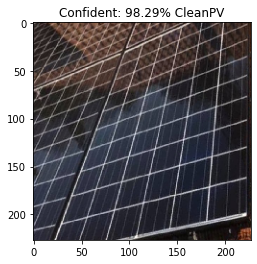

DirtyPV-TEST-(38).jpg
Actual: DirtyPV


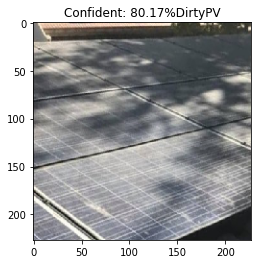

DirtyPV-TEST-(33).jpg
Actual: DirtyPV


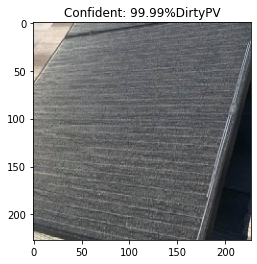

DirtyPV-TEST-(37).jpg
Actual: DirtyPV


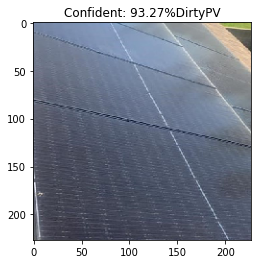

DirtyPV-TEST-(31).jpg
Actual: DirtyPV


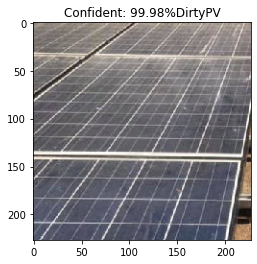

DirtyPV-TEST-(36).jpg
Actual: DirtyPV


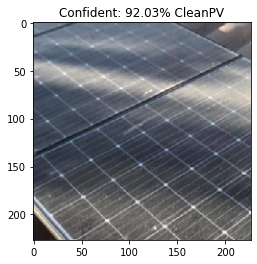

DirtyPV-TEST-(35).jpg
Actual: DirtyPV


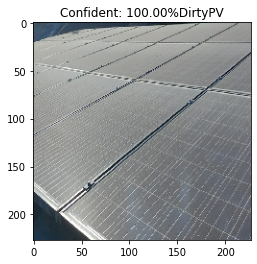

DirtyPV-TEST-(32).jpg
Actual: DirtyPV


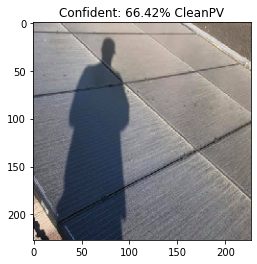

DirtyPV-TEST-(34).jpg
Actual: DirtyPV


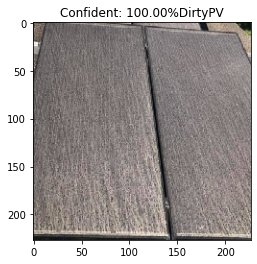

DirtyPV-TEST-(3).jpg
Actual: DirtyPV


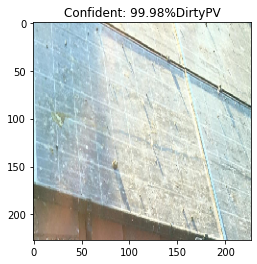

DirtyPV-TEST-(30).jpg
Actual: DirtyPV


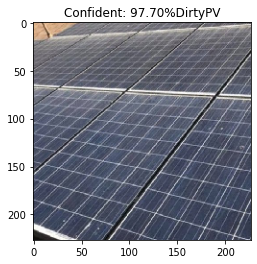

DirtyPV-TEST-(29).jpg
Actual: DirtyPV


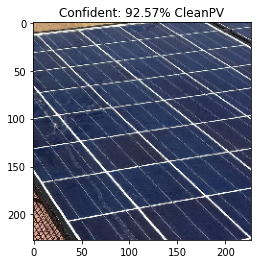

DirtyPV-TEST-(28).jpg
Actual: DirtyPV


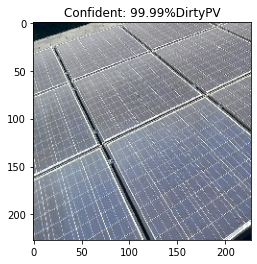

DirtyPV-TEST-(26).jpg
Actual: DirtyPV


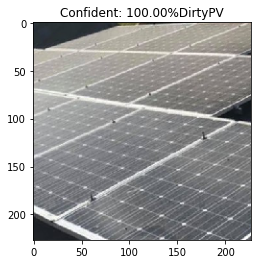

DirtyPV-TEST-(24).jpg
Actual: DirtyPV


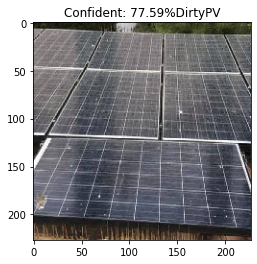

DirtyPV-TEST-(22).jpg
Actual: DirtyPV


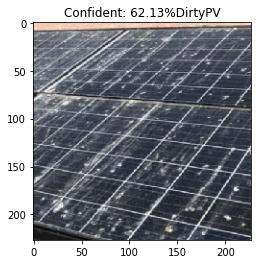

DirtyPV-TEST-(23).jpg
Actual: DirtyPV


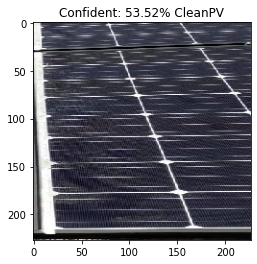

DirtyPV-TEST-(25).jpg
Actual: DirtyPV


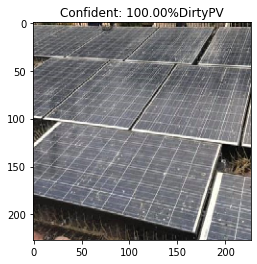

DirtyPV-TEST-(27).jpg
Actual: DirtyPV


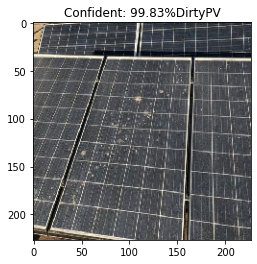

DirtyPV-TEST-(20).jpg
Actual: DirtyPV


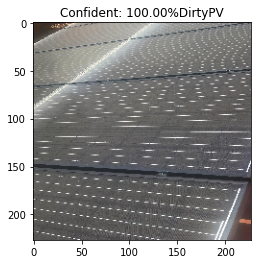

DirtyPV-TEST-(21).jpg
Actual: DirtyPV


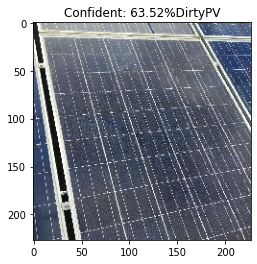

DirtyPV-TEST-(2).jpg
Actual: DirtyPV


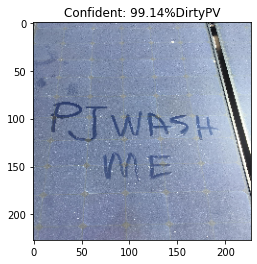

DirtyPV-TEST-(19).jpg
Actual: DirtyPV


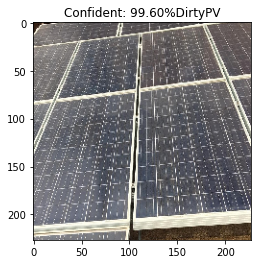

DirtyPV-TEST-(13).jpg
Actual: DirtyPV


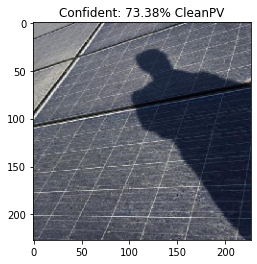

DirtyPV-TEST-(15).jpg
Actual: DirtyPV


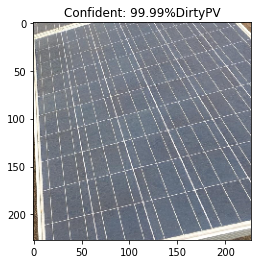

DirtyPV-TEST-(18).jpg
Actual: DirtyPV


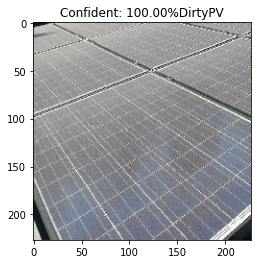

DirtyPV-TEST-(17).jpg
Actual: DirtyPV


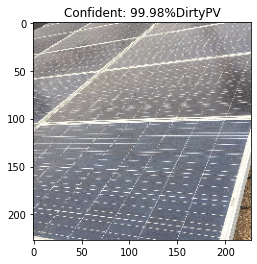

DirtyPV-TEST-(14).jpg
Actual: DirtyPV


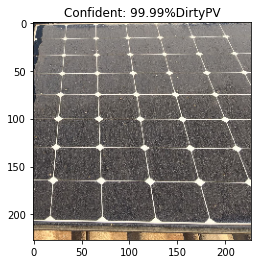

DirtyPV-TEST-(12).jpg
Actual: DirtyPV


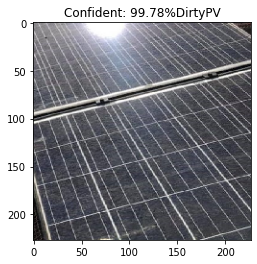

DirtyPV-TEST-(10).jpg
Actual: DirtyPV


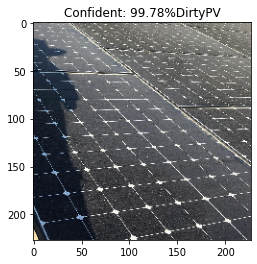

DirtyPV-TEST-(1).jpg
Actual: DirtyPV


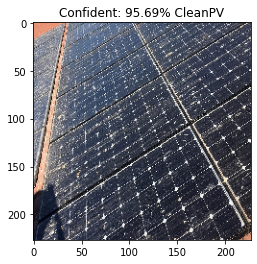

CleanPV-TEST-(9).jpg
Actual: CleanPV


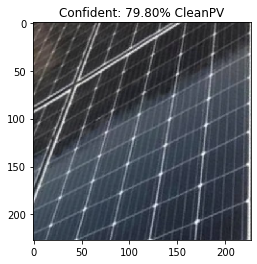

CleanPV-TEST-(8).jpg
Actual: CleanPV


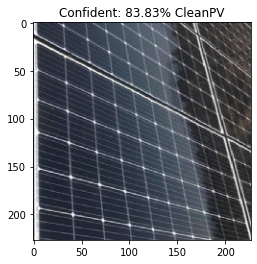

CleanPV-TEST-(7).jpg
Actual: CleanPV


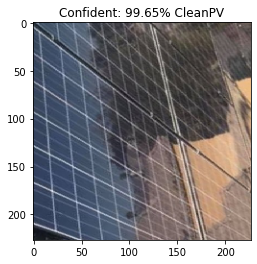

CleanPV-TEST-(66).jpg
Actual: CleanPV


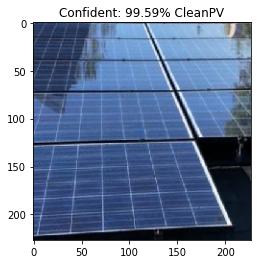

CleanPV-TEST-(65).jpg
Actual: CleanPV


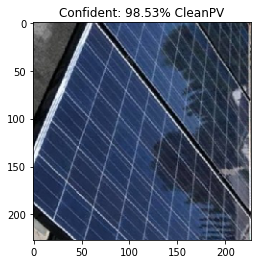

CleanPV-TEST-(61).jpg
Actual: CleanPV


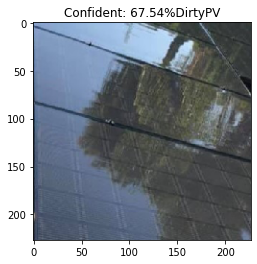

CleanPV-TEST-(63).jpg
Actual: CleanPV


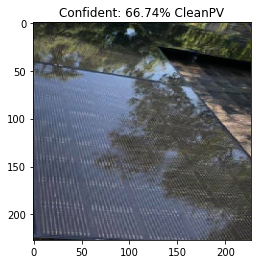

CleanPV-TEST-(64).jpg
Actual: CleanPV


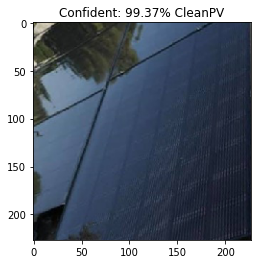

CleanPV-TEST-(62).jpg
Actual: CleanPV


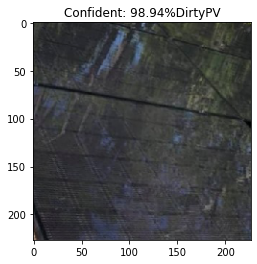

CleanPV-TEST-(60).jpg
Actual: CleanPV


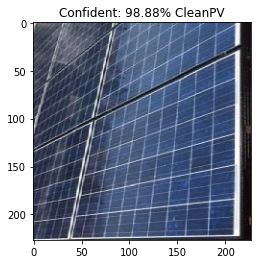

CleanPV-TEST-(6).jpg
Actual: CleanPV


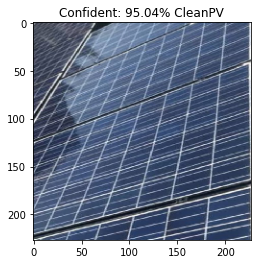

CleanPV-TEST-(59).jpg
Actual: CleanPV


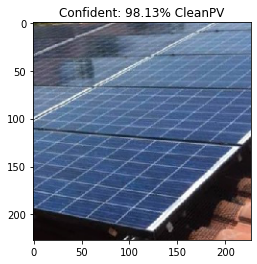

CleanPV-TEST-(58).jpg
Actual: CleanPV


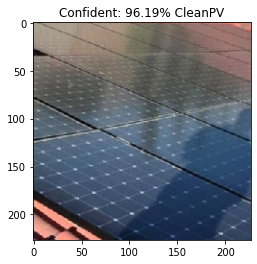

CleanPV-TEST-(51).jpg
Actual: CleanPV


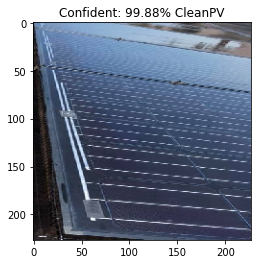

CleanPV-TEST-(52).jpg
Actual: CleanPV


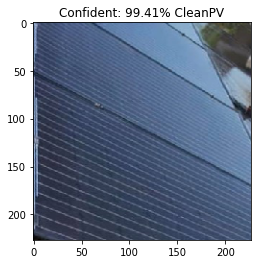

CleanPV-TEST-(54).jpg
Actual: CleanPV


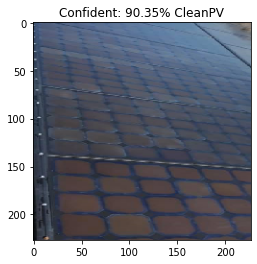

CleanPV-TEST-(57).jpg
Actual: CleanPV


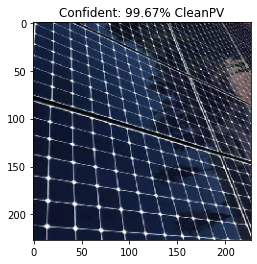

CleanPV-TEST-(55).jpg
Actual: CleanPV


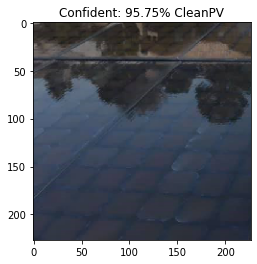

CleanPV-TEST-(56).jpg
Actual: CleanPV


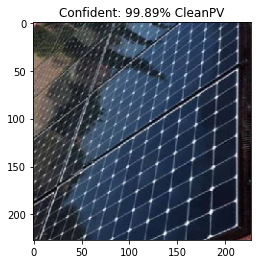

CleanPV-TEST-(50).jpg
Actual: CleanPV


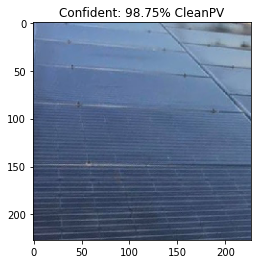

DirtyPV-TEST-(9).jpg
Actual: DirtyPV


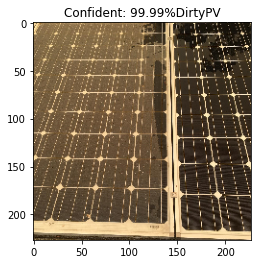

DirtyPV-TEST-(8).jpg
Actual: DirtyPV


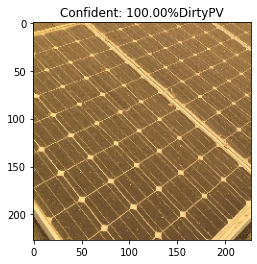

DirtyPV-TEST-(67).jpg
Actual: DirtyPV


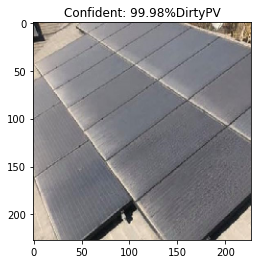

DirtyPV-TEST-(61).jpg
Actual: DirtyPV


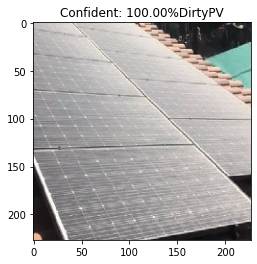

DirtyPV-TEST-(64).jpg
Actual: DirtyPV


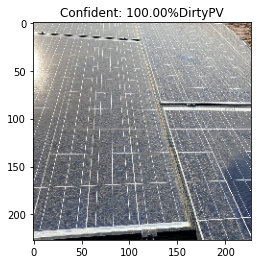

DirtyPV-TEST-(62).jpg
Actual: DirtyPV


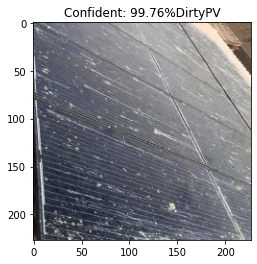

DirtyPV-TEST-(66).jpg
Actual: DirtyPV


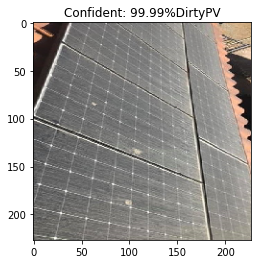

DirtyPV-TEST-(65).jpg
Actual: DirtyPV


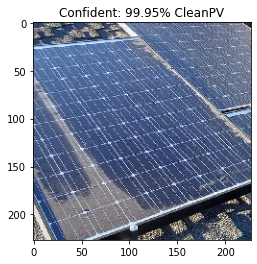

DirtyPV-TEST-(60).jpg
Actual: DirtyPV


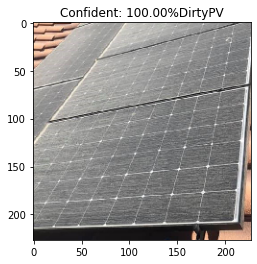

DirtyPV-TEST-(6).jpg
Actual: DirtyPV


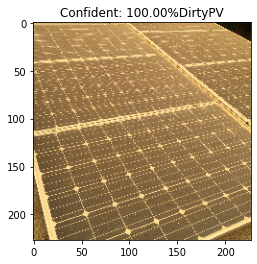

DirtyPV-TEST-(59).jpg
Actual: DirtyPV


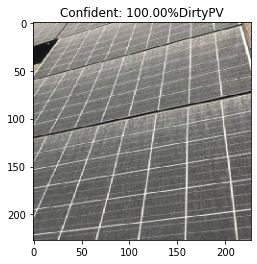

DirtyPV-TEST-(58).jpg
Actual: DirtyPV


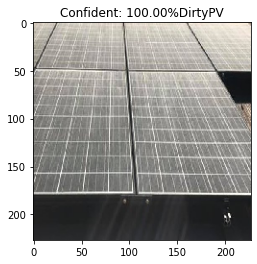

DirtyPV-TEST-(56).jpg
Actual: DirtyPV


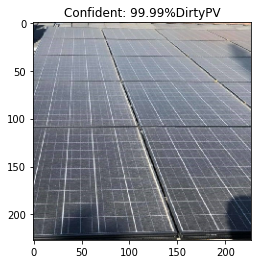

DirtyPV-TEST-(57).jpg
Actual: DirtyPV


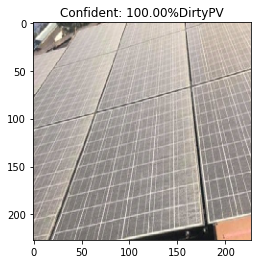

DirtyPV-TEST-(54).jpg
Actual: DirtyPV


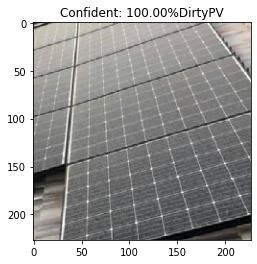

DirtyPV-TEST-(53).jpg
Actual: DirtyPV


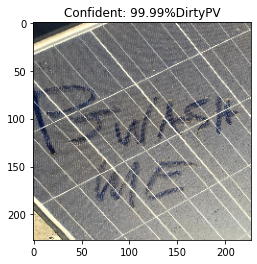

DirtyPV-TEST-(55).jpg
Actual: DirtyPV


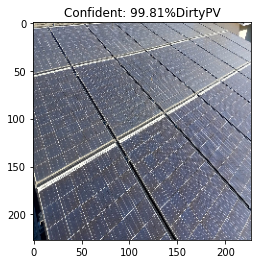

DirtyPV-TEST-(5).jpg
Actual: DirtyPV


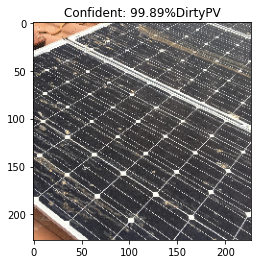

DirtyPV-TEST-(52).jpg
Actual: DirtyPV


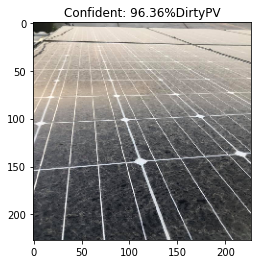

DirtyPV-TEST-(50).jpg
Actual: DirtyPV


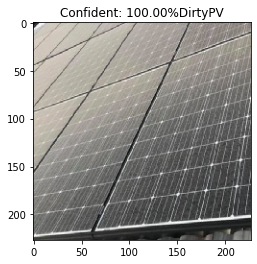

DirtyPV-TEST-(49).jpg
Actual: DirtyPV


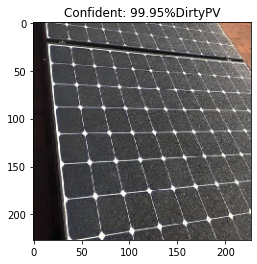

DirtyPV-TEST-(48).jpg
Actual: DirtyPV


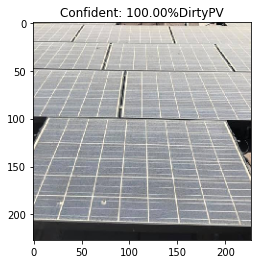

DirtyPV-TEST-(46).jpg
Actual: DirtyPV


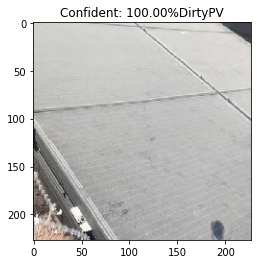

DirtyPV-TEST-(41).jpg
Actual: DirtyPV


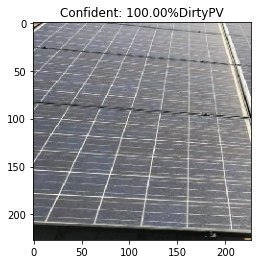

DirtyPV-TEST-(4).jpg
Actual: DirtyPV


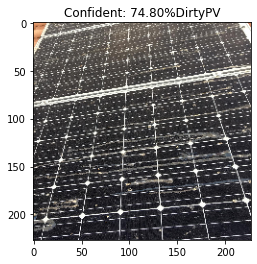

DirtyPV-TEST-(47).jpg
Actual: DirtyPV


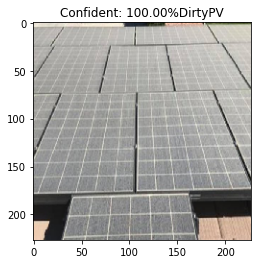

DirtyPV-TEST-(44).jpg
Actual: DirtyPV


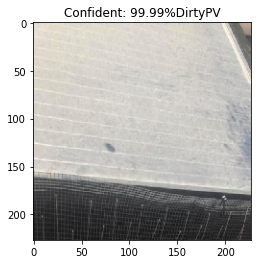

DirtyPV-TEST-(42).jpg
Actual: DirtyPV


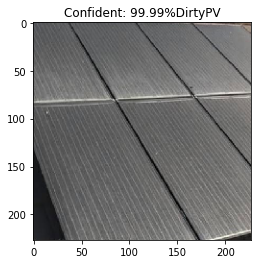

DirtyPV-TEST-(43).jpg
Actual: DirtyPV


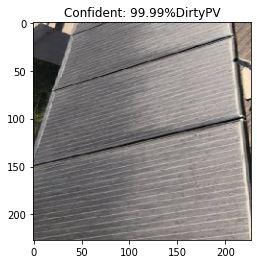

DirtyPV-TEST-(40).jpg
Actual: DirtyPV


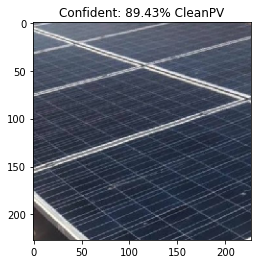

DirtyPV-TEST-(39).jpg
Actual: DirtyPV


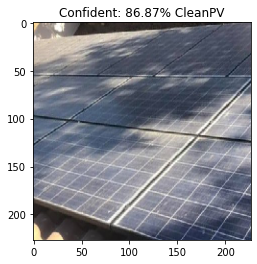

In [ ]:
from keras.models import load_model
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import numpy as np
import matplotlib.pyplot as plt
import os

y_true = []
y_pred = []  
model = load_model('/content/drive/MyDrive/Alexa_splitfolder/Alexnet_model.h5')
fig, ax = plt.subplots()  
for img in os.listdir('/content/drive/MyDrive/DirtyAndClean-122-Test'):
    print(img)
    img_class_name = img.split('-')[0]
    if img_class_name == 'DirtyPV':
        y_true.append(0) 
    else:
        y_true.append(1)
    print("Actual:", img_class_name)
    image = load_img('/content/drive/MyDrive/DirtyAndClean-122-Test/'+img, target_size=(227, 227))
    orig_img = image
    img = np.array(image)
    img = img / 255.0
    img = img.reshape(1,227,227,3)
    label = np.argmax(model.predict(img))
    y_pred.append(label)
    if label == 1:
        plt.title ("Confident: %.2f"%(model.predict(img)[0][1]*100)+ "% CleanPV")
    else:
        plt.title("Confident: %.2f"%(model.predict(img)[0][0]*100)+ "%DirtyPV")
    plt.imshow(image)
    plt.show()

**Confusion matrix of Test Images Prediction**

[[52  9]
 [ 9 52]]


[Text(0, 0.5, 'DirtyPV'), Text(0, 1.5, 'CleanPV')]

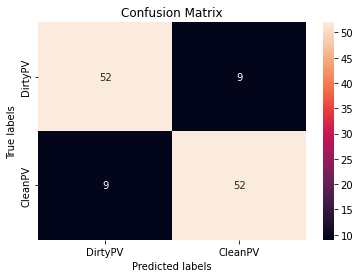

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
cfm = confusion_matrix(y_true, y_pred)
print(cfm)
ax= plt.subplot()
sns.heatmap(cfm, annot=True, ax = ax);
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['DirtyPV', 'CleanPV'])
ax.yaxis.set_ticklabels(['DirtyPV', 'CleanPV'])

In [ ]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85        61
           1       0.85      0.85      0.85        61

    accuracy                           0.85       122
   macro avg       0.85      0.85      0.85       122
weighted avg       0.85      0.85      0.85       122

